# Our goal here is try different techniques of Image pre-processing for work with deep learning. 

The images used are from Google images. 

The original tutorial could be found at: [Parte 1](https://towardsdatascience.com/massive-tutorial-on-image-processing-and-preparation-for-deep-learning-in-python-1-e534ee42f122), and [Parte 2](https://towardsdatascience.com/massive-tutorial-on-image-processing-and-preparation-for-deep-learning-in-python-2-14816263b4a5)

In [1]:
pip install scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from skimage.io import imread  # pip install scikit-image
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def compare(
    original,
    filtered,
    title_filtered="Filtered",
    cmap_type="gray",
    axis=False,
    title_original="Original",
):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8), sharex=True, sharey=True)

    ax1.imshow(original, cmap=cmap_type)
    ax1.set_title(title_original)

    ax2.imshow(filtered, cmap=cmap_type)
    ax2.set_title(title_filtered)

    if not axis:
        ax1.axis("off")
        ax2.axis("off")
    plt.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0.01)
    plt.margins(0, 0)
    plt.show();

In [4]:
def show(image: np.ndarray, title="Image", cmap_type="gray", axis=False):
    """
    A function to display np.ndarrays as images
    """
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    if not axis:
        plt.axis("off")
    plt.margins(0, 0)
    plt.show();

In [5]:
#Images are loaded as NumPy ndarrays in both Matplotlib and Skimage.
image = imread("/processar_gatos.jpeg")

type(image)
np.ndarray

numpy.ndarray

In [6]:
image

array([[[ 57,  53,  52],
        [ 57,  53,  52],
        [ 58,  54,  53],
        ...,
        [ 23,  34,  28],
        [ 25,  34,  29],
        [ 26,  35,  30]],

       [[ 56,  52,  51],
        [ 57,  53,  52],
        [ 57,  53,  52],
        ...,
        [ 23,  34,  28],
        [ 24,  35,  29],
        [ 25,  34,  29]],

       [[ 56,  52,  51],
        [ 56,  52,  51],
        [ 56,  52,  51],
        ...,
        [ 22,  33,  29],
        [ 23,  34,  30],
        [ 24,  33,  30]],

       ...,

       [[ 86,  95, 100],
        [ 88,  97, 102],
        [ 89,  98, 103],
        ...,
        [ 86,  70,  57],
        [ 85,  69,  56],
        [ 85,  69,  56]],

       [[ 87,  96, 101],
        [ 89,  98, 103],
        [ 91, 100, 105],
        ...,
        [ 87,  71,  58],
        [ 86,  70,  57],
        [ 86,  70,  57]],

       [[ 88,  97, 102],
        [ 89,  98, 103],
        [ 91, 100, 105],
        ...,
        [ 87,  71,  58],
        [ 87,  71,  58],
        [ 86,  70,  57]]

In [7]:
#general details about the image
image.shape

(933, 1400, 3)

In [8]:
image.ndim

3

In [9]:
image.size

3918600

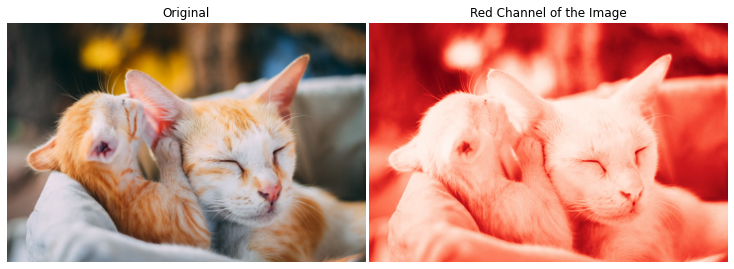

In [10]:
#channel: 0 for red, 1 for green, and 2 for the blue channel — easy enough.

red = image[:, :, 0]
compare(image, red, "Red Channel of the Image", cmap_type="Reds_r")


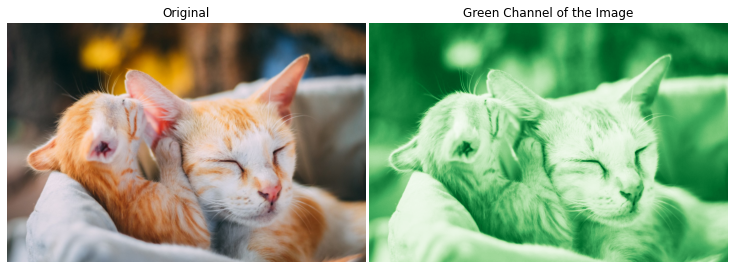

In [11]:
green = image[:, :, 1]

compare(image, green, "Green Channel of the Image", "Greens_r")

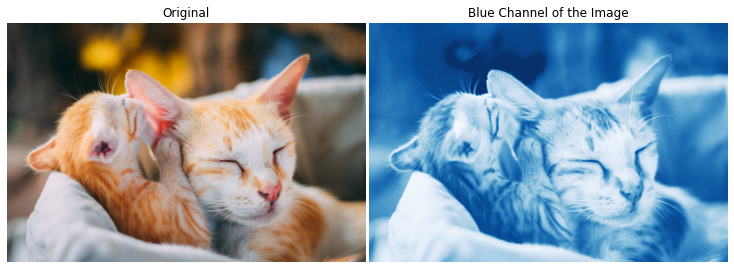

In [12]:
blue = image[:, :, 2]

compare(image, blue, "Blue Channel of the Image", "Blues_r")

In [13]:
image[0,0]

array([57, 53, 52], dtype=uint8)

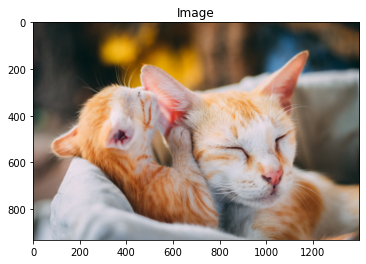

In [14]:
show(image, axis=True)
#When we plot images in Matplotlib, axes denote the ordering of the pixels, but we will usually be hiding them since they don't deliver much value to the viewer.

**Common transformations**: 
The most common image transformation we will be performing is converting color images to grayscale. Many image processing algorithms require grayscale, 2D arrays because the color isn't the defining feature of pictures, and computers can already extract enough information without it.

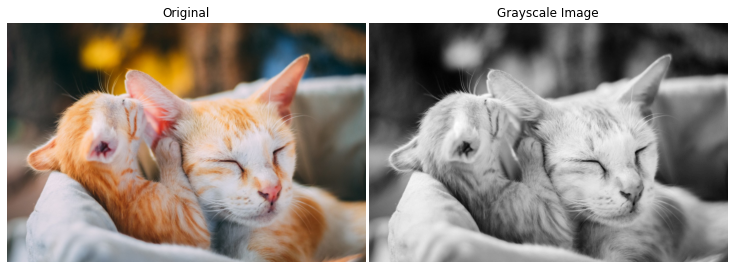

In [15]:
from skimage.color import rgb2gray

# Convert image to grayscale
gray = rgb2gray(image)

compare(image, gray, "Grayscale Image")

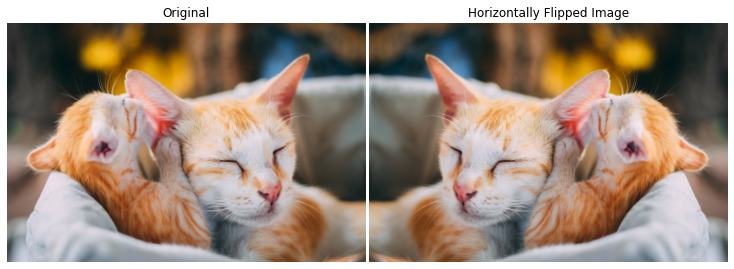

In [16]:
horizontal_flipped = np.fliplr(image)

compare(image, horizontal_flipped, "Horizontally Flipped Image")

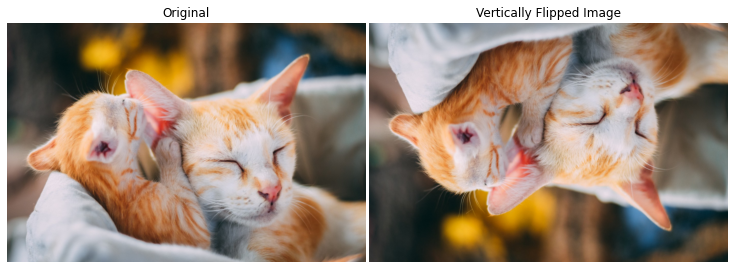

In [17]:
vertically_flipped = np.flipud(image)

compare(image, vertically_flipped, "Vertically Flipped Image")

Sometimes, it is helpful to look at the intensity of each color channel to get a feel of the color distributions. We can do so by slicing each color channel and plotting their histograms

Apart from the few Matplotlib details, you should pay attention to the call of the hist function. Once we extract the color channel and its array, we flatten it into a 1D array and pass it to the hist function. The bins should be 256, one for every pixel value - 0 being pitch black and 255 being entirely white.



In [18]:
def plot_with_hist_channel(image, channel):
  
    channels = ["red", "green", "blue"]
    channel_idx = channels.index(channel)
    color = channels[channel_idx]

    extracted_channel = image[:, :, channel_idx]
    
    fig, (ax1, ax2) = plt.subplots(
        ncols=2, figsize=(18, 6)
    )

    ax1.imshow(image)
    ax1.axis("off")
    
    ax2.hist(extracted_channel.ravel(), bins=256, color=color)
    
    ax2.set_title(f"{channels[channel_idx]} histogram")

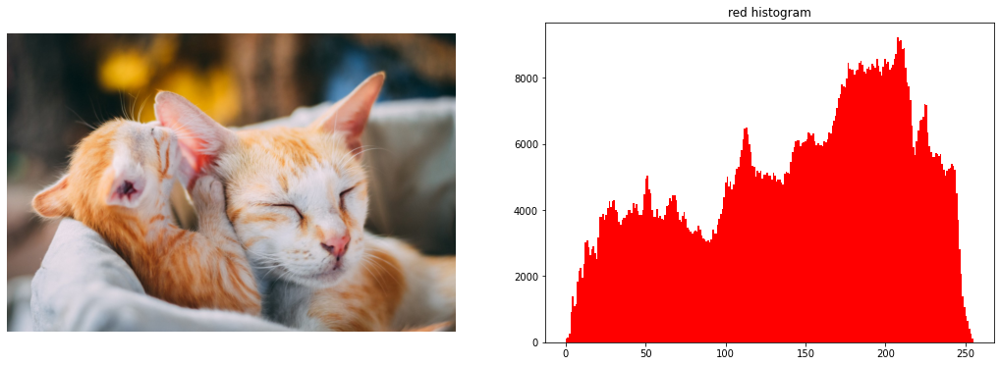

In [19]:
plot_with_hist_channel(image, "red")


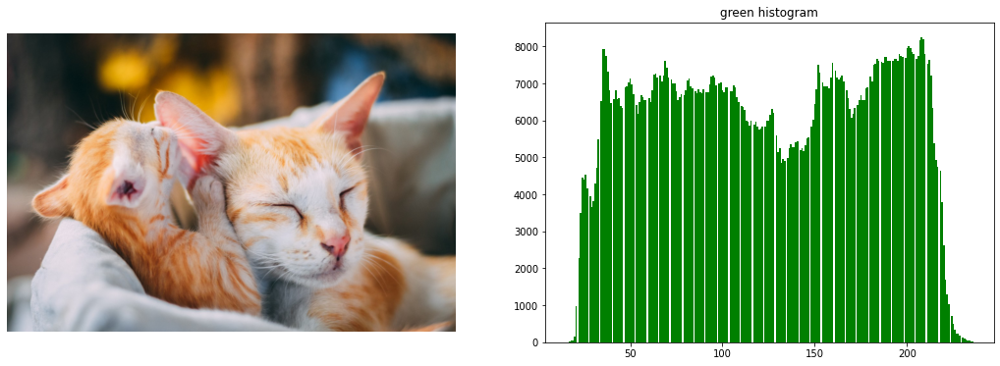

In [20]:
plot_with_hist_channel(image, "green")


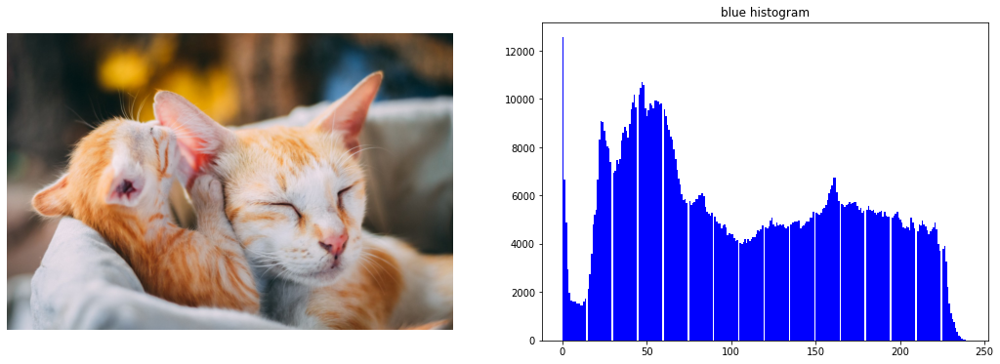

In [21]:
plot_with_hist_channel(image, "blue")


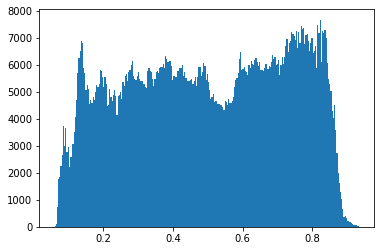

In [22]:
gray_color_scenery = rgb2gray(image)

plt.hist(gray_color_scenery.ravel(), bins=256); 

# **Filters**

**Thresholding** has many applications in image segmentation, object detection, finding edges or contours, etc. It is mainly used to differentiate the background and foreground of an image.

Thresholding works best on high contrast grayscale images, so we need to first convert the image


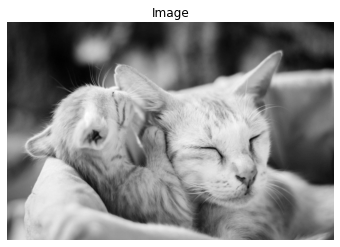

In [23]:
# Convert to graysacle
cat_gray = rgb2gray(image)

show(cat_gray)

We will start with basic manual thresholding and move on to automatic.



In [24]:
#First, we look at the mean value of all pixels in the gray image:
#Note that the above gray image’s pixels are normalized between 0 and 1 by dividing all their values by 256.

image.mean()/256

#The method from the original tutorial didn't work to this image. So I normalized one more time to find out the threshold

0.48877570871931303

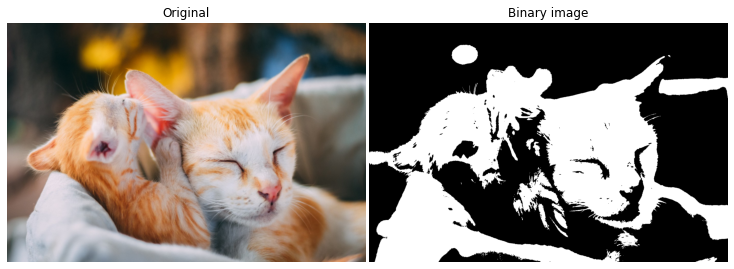

In [25]:
#Now, we use this threshold to mask the image array. If the pixel value is lower than the threshold, its value becomes 0 — black or 1 — white if otherwise. In other words, we get a black and white binary picture:

# Set threshold
threshold = 0.6
# Binarize
binary_image = cat_gray > threshold

compare(image, binary_image, "Binary image")

In this version, we can differentiate the outline more clearly. We can reverse the mask so that the background turns white:

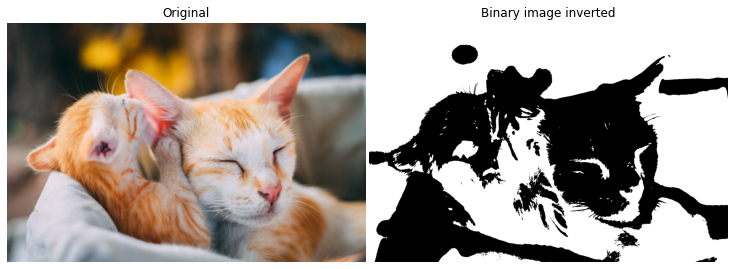

In [26]:
inverted_binary = cat_gray <= threshold

compare(image, inverted_binary, "Binary image inverted")

**Thresholding — global**: 
While it might be fun trying out different thresholds and seeing their effect on the image, we usually perform thresholding using an algorithm that will be more robust than our eyeball estimates.

There are many thresholding algorithms, so it might be hard to choose one. In this case, skimage has try_all_threshold function, which runs seven thresholding algorithms on the given grayscale image

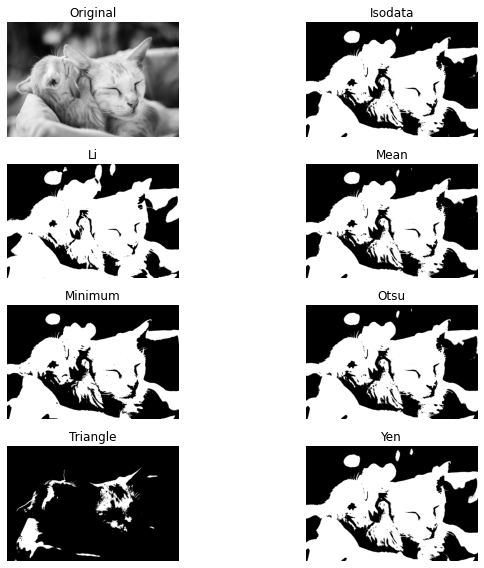

In [27]:
from skimage.filters import try_all_threshold

fig, ax = try_all_threshold(
    cat_gray, figsize=(10, 8), verbose=False
  )

**Thresholding — local:**
Instead of looking at the whole image, local algorithms focus on pixel neighborhoods to account for the uneven brightness in different regions.

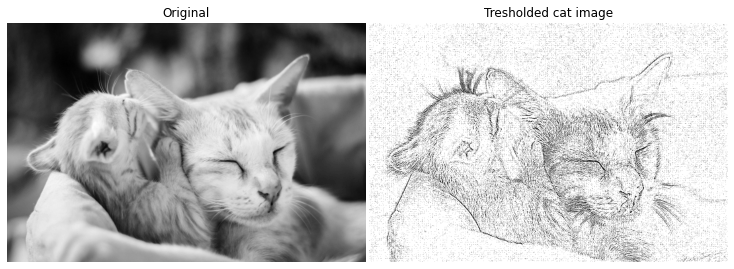

In [28]:
from skimage.filters import threshold_local

local_thresh = threshold_local(cat_gray, block_size=3, offset=0.00016)

binary_flower = cat_gray > local_thresh

compare(cat_gray, binary_flower, "Tresholded cat image")

we have to play around with the offset argument to find the optimal image to our needs. offset is the constant that is subtracted from the mean of the local pixel neighborhood. This "pixel neighborhood" is determined with the block_size parameter in local_threshold, which denotes the number of pixels the algorithm looks around each point in each direction.

Obviously, it is a disadvantage to tune both offset and block_size but local thresholding is the only option that yields better results than manual or global thresholding.

As we can see in line 29 there's no a big difference of light at different points of the image.
Depending on the lightness of an image, the performance of thresholding algorithms also changes. For this reason, thresholding algorithms typically have two types:
- Global — for photos with even, uniform backgrounds
- Local — for images with different brightness levels in various picture regions.


So both global and local thresholding worked considerable well. 



**Edge detection** is useful in many ways, such as identifying objects, extracting features from them, counting them, and many more. We will start with the basic Sobel filter, which finds the edges of objects in grayscale images. 



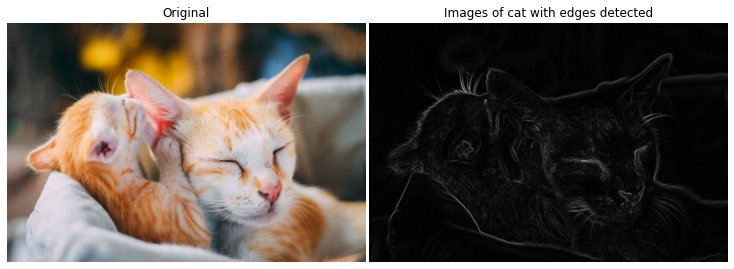

In [29]:
from skimage.filters import sobel

cat_edge = sobel(cat_gray)

compare(image, cat_edge, "Images of cat with edges detected")

**Smoothing**: **negrito**
Another image filtering technique is smoothing. Many images like the cats above may contain random noise with no valuable information to ML and DL algorithms.

For example, the fur around the cat head add noise to the image, which may deviate the attention of ML models from the main objects themselves. We use smoothing to blur the noise or edges and reduce contrast in such scenarios.

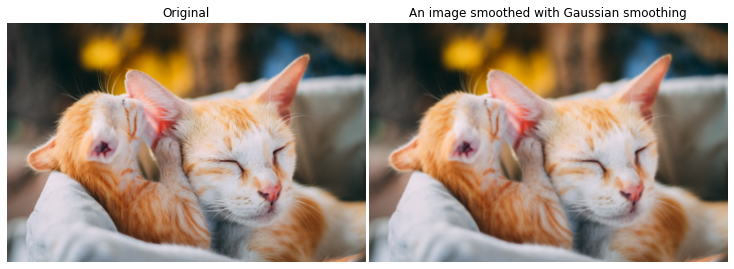

In [30]:
from skimage.filters import gaussian

smoothed = gaussian(image, multichannel=True, sigma=2)

compare(image, smoothed, "An image smoothed with Gaussian smoothing")

**Contrast enhancement**: Certain types of images like medical analysis results have low contrast, making it hard to spot details. 

We can use contrast enhancement to make the details more distinct in such scenarios. There are two types of contrast enhancement algorithms:

- Contrast stretching
- Histogram equalization

Histogram equalization has three types:

- Standard histogram equalization
- Adaptive histogram equalization
- Contrast Limited Adaptive Histogram Equalization (CLAHE)


Histogram equalization spreads out the areas with the highest contrast of an image to less bright regions, equalizing it.


Let's see how this work in un X-ray image.

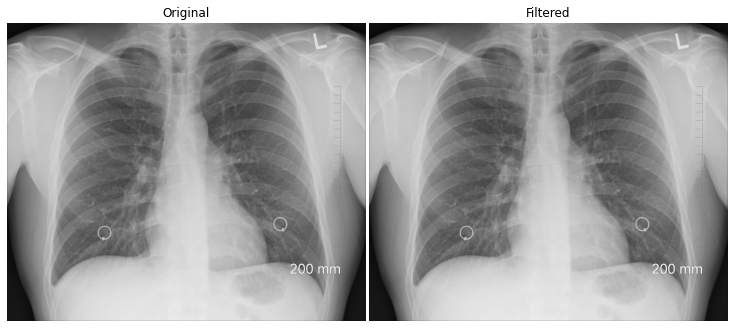

In [31]:
xray = imread("/diagnosis-ga32a23a80_1920.jpg")
xray_gray = rgb2gray(xray)

compare(xray, xray_gray)

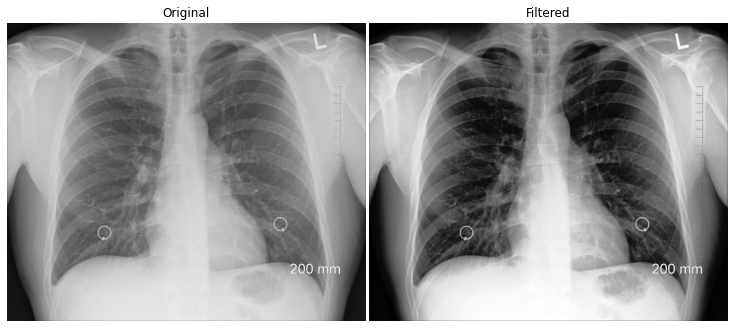

In [32]:
#standard histogram equalization from the exposure module
from skimage.exposure import equalize_hist
enhanced = equalize_hist(xray_gray)

compare(xray, enhanced)

We can use the CLAHE, which computes many histograms for different pixel neighborhoods in an image, which results in more detail even in the darkest of the regions:

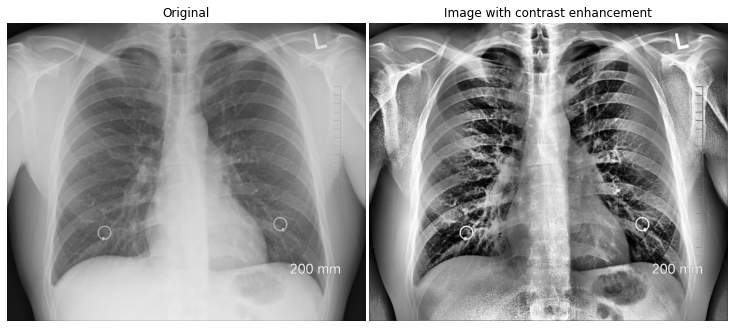

In [33]:
from skimage.exposure import equalize_adapthist

# Adjust clip_limit
enhanced_adaptive = equalize_adapthist(xray_gray, clip_limit=0.5)

compare(xray, enhanced_adaptive, "Image with contrast enhancement")

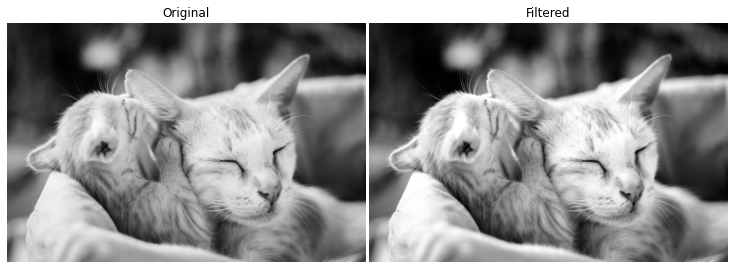

In [34]:
enhanced1 = equalize_hist(cat_gray)

compare(cat_gray, enhanced1)

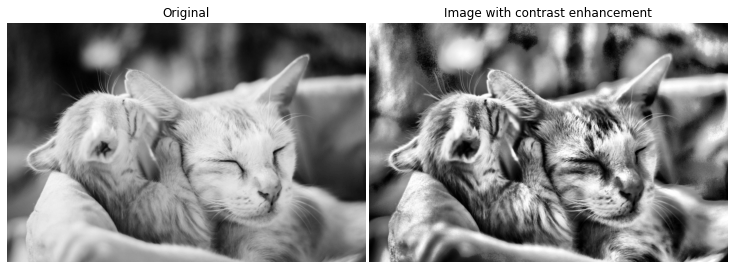

In [35]:
# Adjust clip_limit
enhanced_adaptive1 = equalize_adapthist(cat_gray, clip_limit=0.8)

compare(cat_gray, enhanced_adaptive1, "Image with contrast enhancement")

**Transformations**:
Images in your dataset might have several clashing characteristics, like different scales, unaligned rotations, etc. ML and DL algorithms expect your pictures to have the same shape and dimensions. Therefore, you need to learn how to fix them.

**Rotations**


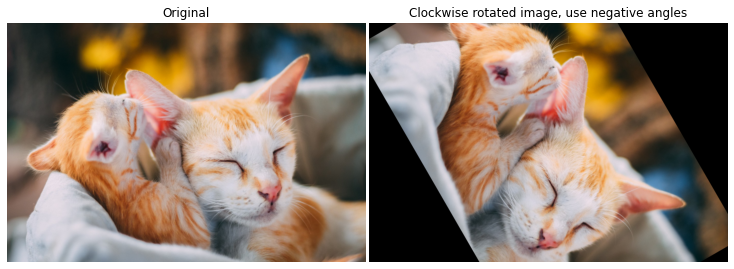

In [36]:
from skimage.transform import rotate

clockwise = rotate(image, angle=-60)
compare(image, clockwise, "Clockwise rotated image, use negative angles")

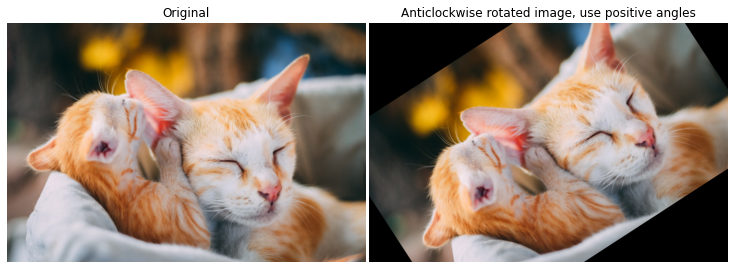

In [37]:
anti_clockwise = rotate(image, angle=33)

compare(image, anti_clockwise, "Anticlockwise rotated image, use positive angles")

**Rescaling**: Another standard operation is scaling images, and it is primarily helpful in cases where images are proportionally different.

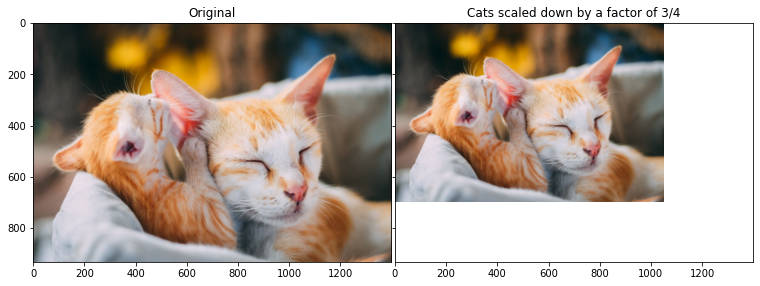

In [42]:
from skimage.transform import rescale

scaled_cats = rescale(image, scale=3 / 4, multichannel=True)
#Use multichannel=False for gray image

compare(
    image,
    scaled_cats,
    "Cats scaled down by a factor of 3/4",
    axis=True,
)

When image resolution is high, downscaling it too much might result in quality loss or pixels rubbing together unceremoniously to create unexpected edges or corners. To account for this effect, you can set anti_aliasing to True, which uses Gaussian smoothing under the hood

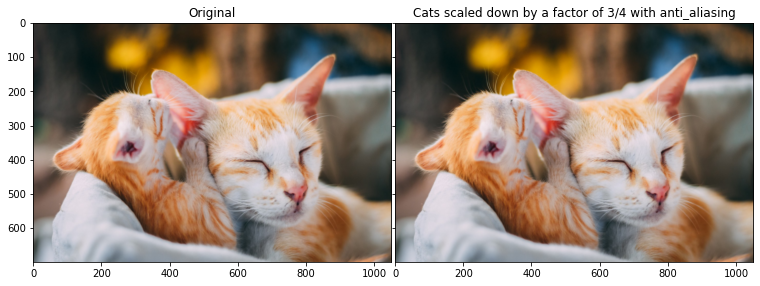

In [44]:
scaled_cats_anti_aliasing = rescale(image, scale=3 / 4, multichannel=True, anti_aliasing=True)
#Use multichannel=False for gray image

compare(
    scaled_cats,
    scaled_cats_anti_aliasing,
    "Cats scaled down by a factor of 3/4 with anti_aliasing",
    axis=True,
)

The smoothing isn’t really noticeable, but it will be evident at a more granular level.

**Resizing:** If you want the image to have specific width and height, rather than scaling it by a factor, you can use the resize function by providing an output_shape

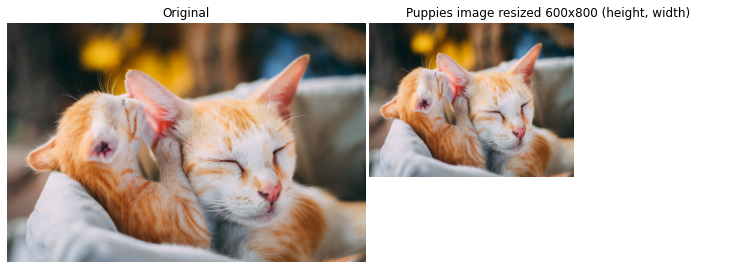

In [46]:
from skimage.transform import resize

# Also possible to set anti_aliasing
cats_600_800 = resize(image, output_shape=(600, 800), anti_aliasing=True)

compare(image, cats_600_800, 
        "Puppies image resized 600x800 (height, width)")

**Image restoration and enhancement**: Some images might be distorted, damaged, or lost during file transforms, in faulty downloads, or many other situations. Rather than giving up on the idea, you can use skimage to account for the damage and make the image good as new.

Inpainting: An inpainting algorithm can intelligently fill in the blanks in an image. We'll manually damage the image to then see how inpainting works.

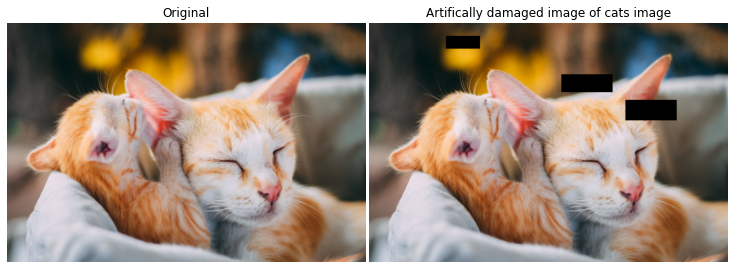

In [47]:
#The below function creates four pitch-black regions to simulate lost information on an image:

def make_mask(image):
    """Create a mask to artificially defect the image."""

    mask = np.zeros(image.shape[:-1])

    # Make 4 masks
    mask[250:300, 1400:1600] = 1
    mask[50:100, 300:433] = 1
    mask[300:380, 1000:1200] = 1
    mask[200:270, 750:950] = 1

    return mask.astype(bool)


# Create the mask
mask = make_mask(image)

# Apply the defect mask on the whale_image
image_defect = image * ~mask[..., np.newaxis]

compare(image, image_defect, "Artifically damaged image of cats image")

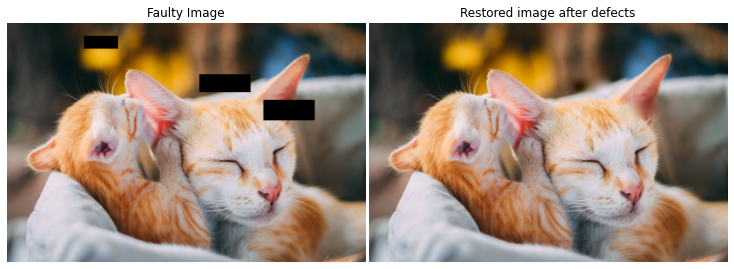

In [48]:
#We will use the inpaint_biharmonic function from the inpaint module to fill in the blanks, passing in the mask we created:

from skimage.restoration import inpaint

restored_image = inpaint.inpaint_biharmonic(image=image_defect, mask=mask, multichannel=True)

compare(
    image_defect,
    restored_image,
    "Restored image after defects",
    title_original="Faulty Image",
)

**Noise**: 
It's plays an essential role in image enhancement and restoration. Sometimes, you might intentionally add it to an image 

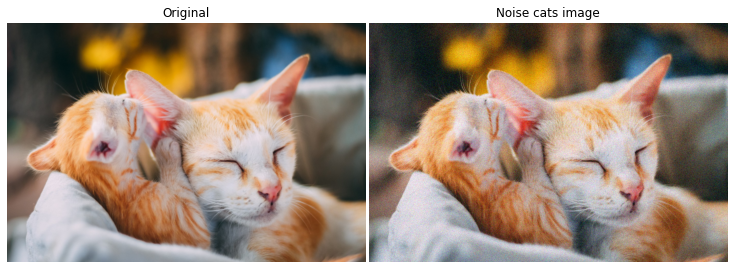

In [49]:
from skimage.util import random_noise

noisy_cats = random_noise(image)

compare(image, noisy_cats, "Noise cats image")

**Reducing noise — denoising**:
But, most of the time, you want to remove noise from an image rather than add it. There are a few types of denoising algorithms:

- Total variation (TV) filter
- Bilateral denoising
- Wavelet denoising
- Non-local mean denoising


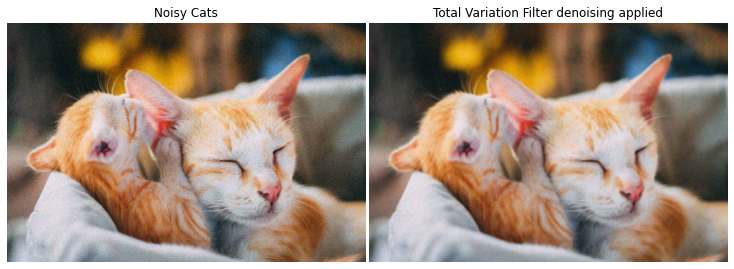

In [59]:
#total variation (TV) filter
from skimage.restoration import denoise_tv_chambolle

denoised_cats_tv = denoise_tv_chambolle(noisy_cats, weight=0.5, n_iter_max = 10, multichannel=True)

compare(
    noisy_cats,
    denoised_cats_tv,
    "Total Variation Filter denoising applied",
    title_original="Noisy Cats",
)

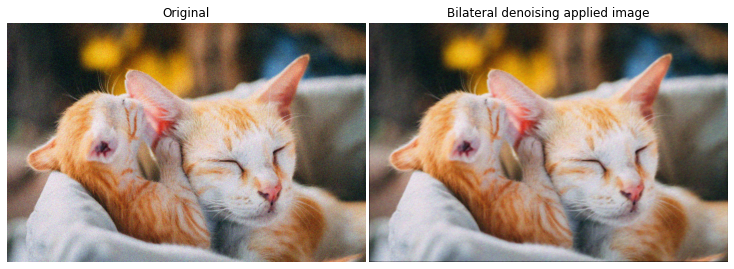

In [60]:
#Denoise bilateral

from skimage.restoration import denoise_bilateral

denoised_cats_bilateral = denoise_bilateral(noisy_cats, multichannel=True)

compare(noisy_cats, denoised_cats_bilateral, "Bilateral denoising applied image")

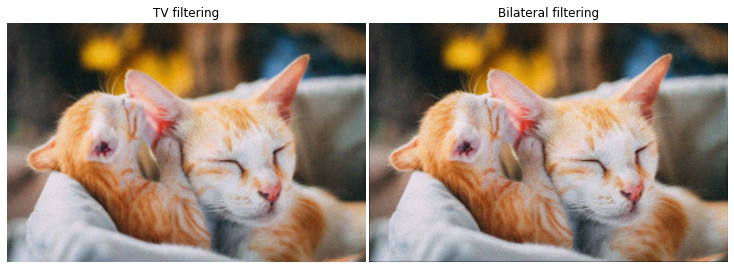

In [61]:
#Comparing the two filters

compare(
    denoised_cats_tv,
    denoised_cats_bilateral,
    "Bilateral filtering",
    title_original="TV filtering",
)

We can see TV filter was more effect

**Superpixels and Segmentation**
Image segmentation is one of the most fundamental and everyday topics in image processing, and it is extensively used in motion and object detection, image classification, and many more areas.

We’ve already seen an instance of segmentation — thresholding an image to extract the background from the foreground. This section will learn to do more than that, such as segmenting images into similar areas.

To get started with segmentation, we need to understand the concept of superpixels.

A pixel, on its own, just represents a small area of color, and once separated from the image, a single pixel will be useless. For this reason, segmentation algorithms use multiple groups of pixels that are similar in contrast, color, or brightness, and they are called superpixels.

One algorithm that tries to find superpixels is the Simple Linear Iterative Cluster (SLIC), which uses k-Means clustering under the hood

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  


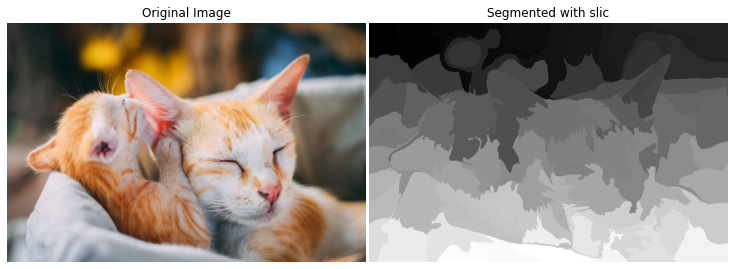

In [68]:
from skimage.segmentation import slic
segments = slic(image)
compare(
    image,
    segments,
    "Segmented with slic",
    title_original="Original Image",
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  after removing the cwd from sys.path.


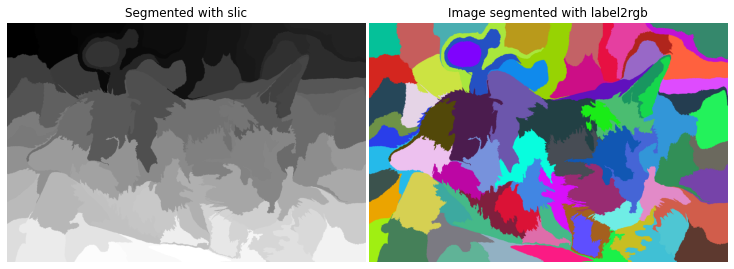

In [104]:
#slic finds 100 segments or labels by default. To put them back onto the image, we use the label2rgb function

from skimage.color import label2rgb
segments_label2rgb = label2rgb(segments, image, kind="avg")

compare(
    segments,
    (segments_label2rgb * 255).astype(np.uint8),
    "Image segmented with label2rgb",
    title_original="Segmented with slic",
)


#plt.imshow((segments_label2rgb * 255).astype(np.uint8))
#show(segments_label2rgb)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: The new recommended value for bg_label is 0. Until version 0.19, the default bg_label value is -1. From version 0.19, the bg_label default value will be 0. To avoid this warning, please explicitly set bg_label value.
  


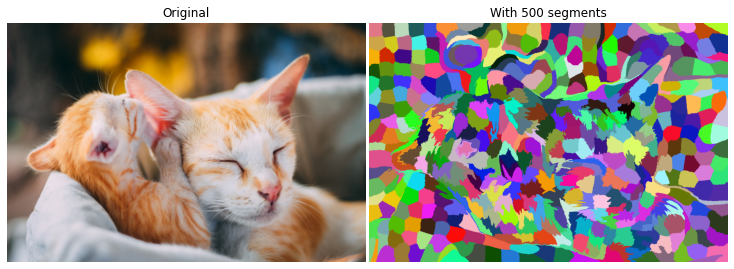

In [102]:
def segment(image, n_segments=100):
    # Obtain superpixels / segments
    superpixels = slic(image, n_segments=n_segments)

    # Put the groups on top of the original image
    segmented_image = label2rgb(superpixels, image, kind="avg")

    return segmented_image
    
# Find 500 segments
coffee_segmented_2 = segment(image, n_segments=500
                             )

compare(image, (coffee_segmented_2 * 255).astype(np.uint8), "With 500 segments")

**Contours**: Much of the information of an object resides in its shape. If we can detect an object’s shape in lines or contours, we can extract valuable data like its size, markings, etc.

In [107]:
from skimage.filters import threshold_otsu
from skimage.measure import find_contours

# Convert to grayscale
#Our cat image in gray is at line 23
# Find optimal threshold with treshold_otsu
thresh = threshold_otsu(cat_gray)
# Binarize
cats_binary = cat_gray > thresh

cat_contours = find_contours(cats_binary)



The resulting array is a list of (n, 2) arrays representing the coordinates of the contour lines

In [108]:
for contour in cat_contours[:5]:
    print(contour.shape)

(13, 2)
(75, 2)
(7, 2)
(275, 2)
(5, 2)


In [109]:
#use a function to find the coordenates
def mark_contours(image):
    """A function to find contours from an image"""
    gray_image = rgb2gray(image)
    # Find optimal threshold
    thresh = threshold_otsu(gray_image)
    # Mask
    binary_image = gray_image > thresh

    contours = find_contours(binary_image)

    return contours

In [110]:
#use a function to plot contour lines

def plot_image_contours(image):
    fig, ax = plt.subplots()

    ax.imshow(image, cmap=plt.cm.gray)

    for contour in mark_contours(image):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="red")

    ax.axis("off")

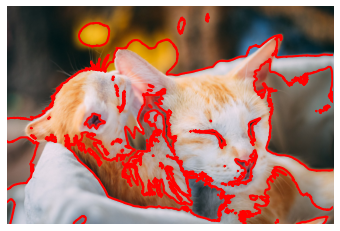

In [111]:
plot_image_contours(image)

Here we can see most important lines were detected, but it missed in the background where it's possible to see a cat shape in the pillow. Let's see how it will do in image with the previous treatment

In [118]:
#use a function to find the coordenates for grey images
def mark_contours_grey(image):
    """A function to find contours from an image"""
    # Find optimal threshold
    thresh = threshold_otsu(image)
    # Mask
    binary_image = image > thresh

    contours = find_contours(binary_image)

    return contours

In [119]:
#use a function to plot contour lines for grey images
def plot_image_contours_grey(image):
    fig, ax = plt.subplots()

    ax.imshow(image, cmap=plt.cm.gray)

    for contour in mark_contours_grey(image):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="red")

    ax.axis("off")

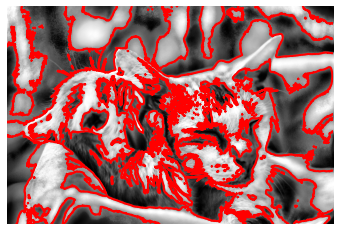

In [120]:
#Image with contrast 
plot_image_contours_grey(enhanced_adaptive1)

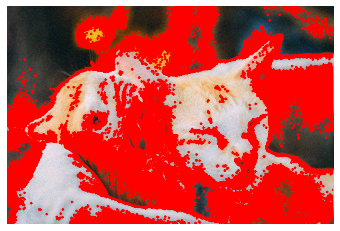

In [122]:
#Image with noise
plot_image_contours(noisy_cats)

As we can see the contour worked better in the image with high contrast

**Edge detection:** Before, we used the Sobel algorithm to detect the edges of objects. Here, we will use the Canny algorithm, which is more widely used because it is faster and more accurate. As always, the function canny requires a grayscale image.

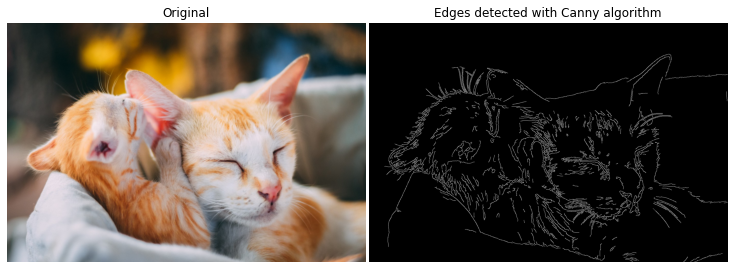

In [130]:
#To find edges, we just pass the image to the canny function:

from skimage.feature import canny

# Find edges with canny
canny_edges = canny(cat_gray)

compare(image, canny_edges, "Edges detected with Canny algorithm")

Canny worked great with our cats image, in cases which more or less sensitivity is needed we can use sigma parameter

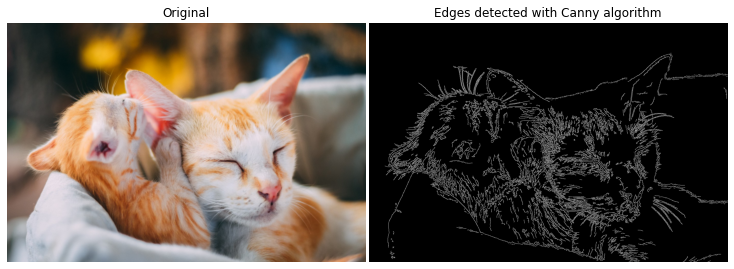

In [135]:
canny_edges2 = canny(cat_gray, sigma=0)

compare(image, canny_edges2, "Edges detected with Canny algorithm")

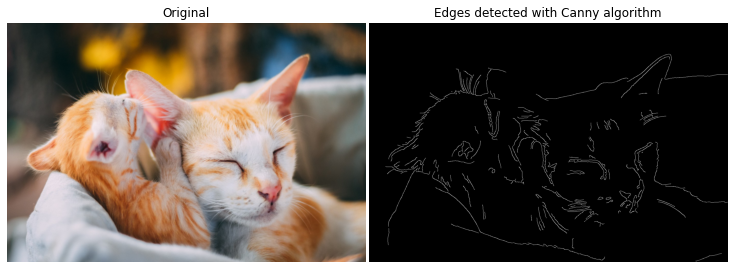

In [141]:
canny_edges3 = canny(cat_gray, sigma=2)

compare(image, canny_edges3, "Edges detected with Canny algorithm")

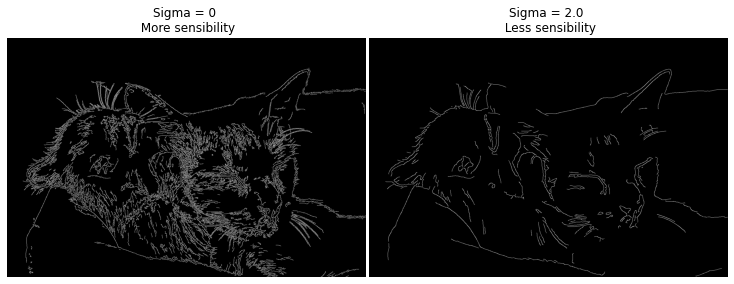

In [142]:
compare(canny_edges2, canny_edges3, "Sigma = 2.0 \n Less sensibility", title_original="Sigma = 0 \n More sensibility")

#sigma default is 0

**Corner detection**:
Another important image processing technique is corner detection. Corners can be key features of objects in image classification.

To find corners, we will use the Harris corner detection algorithm.

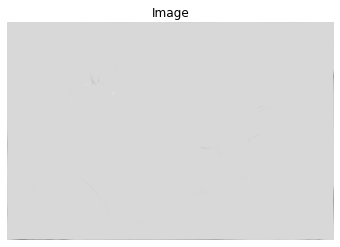

In [147]:
#We will use the corner_harris function to produce a measured image that masks the areas where corners are.

from skimage.feature import corner_harris
measured_image = corner_harris(cat_gray)
show(measured_image)

In [148]:
#Now, we will pass this masked measure image to corner_peaks function, which returns corner coordinates this time:
from skimage.feature import corner_peaks

corner_coords = corner_peaks(measured_image, min_distance=50)

len(corner_coords)

60

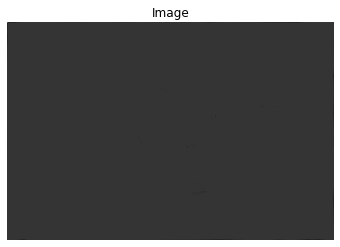

71

In [150]:
#use high contrast gray image
measured_image = corner_harris(enhanced_adaptive1)
show(measured_image)


corner_coords = corner_peaks(measured_image, min_distance=50)

len(corner_coords)

In [152]:
#Let’s wrap the operation up to this point in a function:

def find_corner_coords(image, min_distance=50):
    # Convert to gray
    #gray_image = rgb2gray(image)
    # Produce a measure image
    measure_image = corner_harris(image)

    # Find coords
    coords = corner_peaks(measure_image, min_distance=min_distance)

    return coords

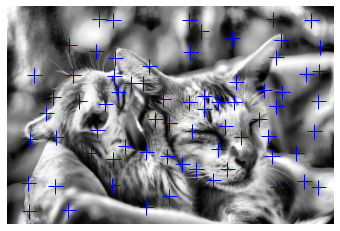

In [154]:
#we will create another function that plots each corner using the coordinates produced from the above function:

def show_image_cornered(image):
    # Find coords
    coords = find_corner_coords(image)

    # Plot them on top of the image
    plt.imshow(image, cmap="gray")
    plt.plot(coords[:, 1], coords[:, 0], "+b", markersize=15)
    plt.axis("off")

show_image_cornered(enhanced_adaptive1)

Unfortunately, the algorithm isn’t working as expected.  Let’s denoise the image and pass it to the function once again:

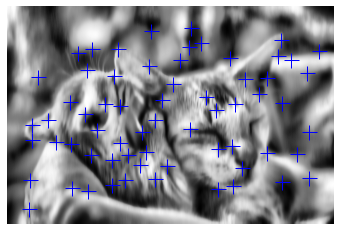

In [168]:
cats_contrast_denoised = denoise_tv_chambolle(enhanced_adaptive1, multichannel=True, weight=1.6)

show_image_cornered(cats_contrast_denoised)